In [1]:
from __future__ import print_function
from __future__ import division
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import torchvision
from torch.utils.tensorboard import SummaryWriter
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import time
import os
import copy
print("PyTorch Version: ",torch.__version__)
print("Torchvision Version: ",torchvision.__version__)

PyTorch Version:  1.11.0+cpu
Torchvision Version:  0.12.0+cpu


In [109]:
data_dir = "/content/drive/MyDrive/Microscopic/dataset"

# Models to choose from [resnet, alexnet, vgg, squeezenet, densenet, inception, mobilenet, shufflenet]
model_name = "shufflenet"

# Number of classes in the dataset
num_classes = 3

# Batch size for training (change depending on how much memory you have)
batch_size = 16

# Number of epochs to train for
num_epochs = 10

# Flag for feature extracting. When False, we finetune the whole model,
#   when True we only update the reshaped layer params
feature_extract = True

model_dir = os.path.join("/content", model_name)

logs_dir = os.path.join(model_dir, "logs")
logs_train = os.path.join(logs_dir, 'training')
logs_val = os.path.join(logs_dir,'validation')

writer_train = SummaryWriter(logs_train)
writer_val = SummaryWriter(logs_val)

In [110]:
def train_model(model, dataloaders, criterion, optimizer, num_epochs=25, is_inception=False):
    since = time.time()

    val_acc_history = []

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    iters = 0

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        val_iters = 0

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for i, (inputs, labels) in enumerate(dataloaders[phase]):
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    # Get model outputs and calculate loss
                    # Special case for inception because in training it has an auxiliary output. In train
                    #   mode we calculate the loss by summing the final output and the auxiliary output
                    #   but in testing we only consider the final output.
                    if is_inception and phase == 'train':
                        # From https://discuss.pytorch.org/t/how-to-optimize-inception-model-with-auxiliary-classifiers/7958
                        outputs, aux_outputs = model(inputs)
                        loss1 = criterion(outputs, labels)
                        loss2 = criterion(aux_outputs, labels)
                        loss = loss1 + 0.4*loss2
                    else:
                        outputs = model(inputs)
                        loss = criterion(outputs, labels)

                    _, preds = torch.max(outputs, 1)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

                # if phase == 'train':
                #   writer_train.add_scalar("Loss", loss.item() * inputs.size(0), iters)
                #   writer_train.add_scalar("Accuracy", torch.sum(preds == labels.data)/16, iters)
                #   iters += 1
                #   val_iters += 1

                  # writer.add_scalar('training loss', running_loss / 1000, epoch *  len(dataloaders[phase].dataset + i)


            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_acc = running_corrects.double() / len(dataloaders[phase].dataset)

            if phase == 'train':
                writer_train.add_scalar("Loss", epoch_loss, epoch)
                writer_train.add_scalar("Accuracy", epoch_acc, epoch)
            else:
                writer_val.add_scalar("Loss", epoch_loss, epoch)
                writer_val.add_scalar("Accuracy", epoch_acc, epoch)

            print('{} Loss: {:.4f} Acc: {:.4f}'.format(phase, epoch_loss, epoch_acc))

            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())
            if phase == 'val':
                val_acc_history.append(epoch_acc)

        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model, val_acc_history

writer_train.flush()
writer_train.close()
writer_val.flush()
writer_val.close()

In [111]:
def set_parameter_requires_grad(model, feature_extracting):
    if feature_extracting:
        for param in model.parameters():
            param.requires_grad = False

In [2]:
def initialize_model(model_name, num_classes, feature_extract, use_pretrained=True):
    # Initialize these variables which will be set in this if statement. Each of these
    #   variables is model specific.
    model_ft = None
    input_size = 0

    if model_name == "resnet":
        """ Resnet18
        """
        model_ft = models.resnet18(pretrained=use_pretrained)
        set_parameter_requires_grad(model_ft, feature_extract)
        num_ftrs = model_ft.fc.in_features
        model_ft.fc = nn.Linear(num_ftrs, num_classes)
        input_size = 224

    elif model_name == "alexnet":
        """ Alexnet
        """
        model_ft = models.alexnet(pretrained=use_pretrained)
        set_parameter_requires_grad(model_ft, feature_extract)
        num_ftrs = model_ft.classifier[6].in_features
        model_ft.classifier[6] = nn.Linear(num_ftrs,num_classes)
        input_size = 224

    elif model_name == "vgg":
        """ VGG11_bn
        """
        model_ft = models.vgg11_bn(pretrained=use_pretrained)
        set_parameter_requires_grad(model_ft, feature_extract)
        num_ftrs = model_ft.classifier[6].in_features
        model_ft.classifier[6] = nn.Linear(num_ftrs,num_classes)
        input_size = 224

    elif model_name == "squeezenet":
        """ Squeezenet
        """
        model_ft = models.squeezenet1_0(pretrained=use_pretrained)
        set_parameter_requires_grad(model_ft, feature_extract)
        model_ft.classifier[1] = nn.Conv2d(512, num_classes, kernel_size=(1,1), stride=(1,1))
        model_ft.num_classes = num_classes
        input_size = 224

    elif model_name == "densenet":
        """ Densenet
        """
        model_ft = models.densenet121(pretrained=use_pretrained)
        set_parameter_requires_grad(model_ft, feature_extract)
        num_ftrs = model_ft.classifier.in_features
        model_ft.classifier = nn.Linear(num_ftrs, num_classes)
        input_size = 224

    elif model_name == "inception":
        """ Inception v3
        Be careful, expects (299,299) sized images and has auxiliary output
        """
        model_ft = models.inception_v3(pretrained=use_pretrained)
        set_parameter_requires_grad(model_ft, feature_extract)
        # Handle the auxilary net
        num_ftrs = model_ft.AuxLogits.fc.in_features
        model_ft.AuxLogits.fc = nn.Linear(num_ftrs, num_classes)
        # Handle the primary net
        num_ftrs = model_ft.fc.in_features
        model_ft.fc = nn.Linear(num_ftrs,num_classes)
        input_size = 299

    elif model_name == "mobilenet":
        """ Mobilenet
        """
        model_ft = models.mobilenet_v3_large(pretrained=use_pretrained)
        set_parameter_requires_grad(model_ft, feature_extract)
        num_ftrs = model_ft.classifier[3].in_features
        model_ft.classifier[3] = nn.Linear(num_ftrs, num_classes)
        input_size = 224

    elif model_name == "shufflenet":
        """ Shufflenet
        """
        model_ft = models.shufflenet_v2_x1_5(pretrained=use_pretrained)
        print(model_ft)
        set_parameter_requires_grad(model_ft, feature_extract)
        num_ftrs = model_ft.fc.in_features
        model_ft.fc = nn.Linear(num_ftrs, num_classes)
        input_size = 224

    else:
        print("Invalid model name, exiting...")
        exit()

    return model_ft, input_size

# Initialize the model for this run
model_ft, input_size = initialize_model(model_name, num_classes, feature_extract, use_pretrained=True)

# Print the model we just instantiated
print(model_ft)

NameError: name 'model_name' is not defined

In [2]:
# Data augmentation and normalization for training
# Just normalization for validation
data_transforms = {
    'train': transforms.Compose([
        transforms.RandomResizedCrop(input_size),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize(input_size),
        transforms.CenterCrop(input_size),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}

print("Initializing Datasets and Dataloaders...")

# Create training and validation datasets
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x), data_transforms[x]) for x in ['train', 'val']}
# Create training and validation dataloaders
dataloaders_dict = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=batch_size, shuffle=True, num_workers=4) for x in ['train', 'val']}

# Detect if we have a GPU available
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

NameError: name 'input_size' is not defined

In [115]:
# Send the model to GPU
model_ft = model_ft.to(device)

# Gather the parameters to be optimized/updated in this run. If we are
#  finetuning we will be updating all parameters. However, if we are
#  doing feature extract method, we will only update the parameters
#  that we have just initialized, i.e. the parameters with requires_grad
#  is True.
params_to_update = model_ft.parameters()
print("Params to learn:")
if feature_extract:
    params_to_update = []
    for name,param in model_ft.named_parameters():
        if param.requires_grad == True:
            params_to_update.append(param)
            print("\t",name)
else:
    for name,param in model_ft.named_parameters():
        if param.requires_grad == True:
            print("\t",name)

# Observe that all parameters are being optimized
optimizer_ft = optim.SGD(params_to_update, lr=0.001, momentum=0.9)

Params to learn:
	 fc.weight
	 fc.bias


In [116]:
# Setup the loss fxn
criterion = nn.CrossEntropyLoss()

# Train and evaluate
model_ft, hist = train_model(model_ft, dataloaders_dict, criterion, optimizer_ft, num_epochs=num_epochs, is_inception=(model_name=="inception"))

Epoch 0/9
----------


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


train Loss: 0.5554 Acc: 0.8311
val Loss: 0.4286 Acc: 0.9734

Epoch 1/9
----------
train Loss: 0.2933 Acc: 0.9327
val Loss: 0.3205 Acc: 0.9645

Epoch 2/9
----------
train Loss: 0.2253 Acc: 0.9518
val Loss: 0.2410 Acc: 0.9858

Epoch 3/9
----------
train Loss: 0.1900 Acc: 0.9594
val Loss: 0.1923 Acc: 1.0000

Epoch 4/9
----------
train Loss: 0.1693 Acc: 0.9612
val Loss: 0.2183 Acc: 0.9840

Epoch 5/9
----------
train Loss: 0.1627 Acc: 0.9646
val Loss: 0.1837 Acc: 0.9805

Epoch 6/9
----------
train Loss: 0.1417 Acc: 0.9661
val Loss: 0.1941 Acc: 0.9858

Epoch 7/9
----------
train Loss: 0.1325 Acc: 0.9718
val Loss: 0.1965 Acc: 0.9823

Epoch 8/9
----------
train Loss: 0.1223 Acc: 0.9722
val Loss: 0.1307 Acc: 0.9858

Epoch 9/9
----------
train Loss: 0.1195 Acc: 0.9729
val Loss: 0.1087 Acc: 0.9982

Training complete in 5m 8s
Best val Acc: 1.000000


In [117]:
save_dir = os.path.join(model_dir, "model")
os.makedirs(save_dir, exist_ok = True)
best_weight = os.path.join(save_dir,'best_weights.pth')
torch.save(model_ft.state_dict(), best_weight)

# Logs

In [118]:
zip_file = model_dir+".zip"

!zip -r $model_dir $model_dir

  adding: content/shufflenet/ (stored 0%)
  adding: content/shufflenet/model/ (stored 0%)
  adding: content/shufflenet/model/best_weights.pth (deflated 8%)
  adding: content/shufflenet/logs/ (stored 0%)
  adding: content/shufflenet/logs/validation/ (stored 0%)
  adding: content/shufflenet/logs/validation/events.out.tfevents.1659130371.00cea55fdaf1.72.31 (deflated 5%)
  adding: content/shufflenet/logs/validation/events.out.tfevents.1659130574.00cea55fdaf1.72.33 (deflated 52%)
  adding: content/shufflenet/logs/training/ (stored 0%)
  adding: content/shufflenet/logs/training/events.out.tfevents.1659130568.00cea55fdaf1.72.32 (deflated 51%)
  adding: content/shufflenet/logs/training/events.out.tfevents.1659130371.00cea55fdaf1.72.30 (deflated 5%)


In [ ]:
from google.colab import files

files.download(zip_file)

In [119]:
%load_ext tensorboard
%reload_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [120]:
!kill $(ps -e | grep 'tensorboard' | awk '{print $1}')

In [121]:
%tensorboard --logdir $logs_dir

<IPython.core.display.Javascript object>

# Inference

In [2]:
def initialize_model_inference(model_name, num_classes, feature_extracte):
    # Initialize these variables which will be set in this if statement. Each of these
    #   variables is model specific.

    if model_name == "resnet":
        """ Resnet18
        """
        model_ft = models.resnet18().to(device)
        num_ftrs = model_ft.fc.in_features
        model_ft.fc = nn.Linear(num_ftrs, num_classes)

    elif model_name == "alexnet":
        """ Alexnet
        """
        model_ft = models.alexnet().to(device)
        num_ftrs = model_ft.classifier[6].in_features
        model_ft.classifier[6] = nn.Linear(num_ftrs,num_classes)
      
    elif model_name == "vgg":
        """ VGG11_bn
        """
        model_ft = models.vgg11_bn().to(device)
        num_ftrs = model_ft.classifier[6].in_features
        model_ft.classifier[6] = nn.Linear(num_ftrs,num_classes)

    elif model_name == "squeezenet":
        """ Squeezenet
        """
        model_ft = models.squeezenet1_0().to(device)
        model_ft.classifier[1] = nn.Conv2d(512, num_classes, kernel_size=(1,1), stride=(1,1))
        model_ft.num_classes = num_classes

    elif model_name == "densenet":
        """ Densenet
        """
        model_ft = models.densenet121().to(device)
        num_ftrs = model_ft.classifier.in_features
        model_ft.classifier = nn.Linear(num_ftrs, num_classes)

    elif model_name == "inception":
        """ Inception v3
        Be careful, expects (299,299) sized images and has auxiliary output
        """
        model_ft = models.inception_v3().to(device)
        # Handle the auxilary net
        num_ftrs = model_ft.AuxLogits.fc.in_features
        model_ft.AuxLogits.fc = nn.Linear(num_ftrs, num_classes)
        # Handle the primary net
        num_ftrs = model_ft.fc.in_features
        model_ft.fc = nn.Linear(num_ftrs,num_classes)

    elif model_name == "mobilenet":
        """ Mobilenet
        """
        model_ft = models.mobilenet_v3_large().to(device)
        num_ftrs = model_ft.classifier[3].in_features
        model_ft.classifier[3] = nn.Linear(num_ftrs, num_classes)

    elif model_name == "shufflenet":
        """ Shufflenet
        """
        model_ft = models.shufflenet_v2_x1_5().to(device)
        num_ftrs = model_ft.fc.in_features
        model_ft.fc = nn.Linear(num_ftrs, num_classes)

    else:
        print("Invalid model name, exiting...")
        exit()

    return model_ft

In [3]:
a= os.listdir('TenRandom')
print(a)

['09h35m06s.jpg', '09h41m56s.jpg', '09h53m47s.jpg', '10h01m08s.jpg', '10h03m55s.jpg', '10h05m53s.jpg', '10h43m04s.jpg', '10h43m34s.jpg', '10h57m48s.jpg', '11h32m01s.jpg']


-----


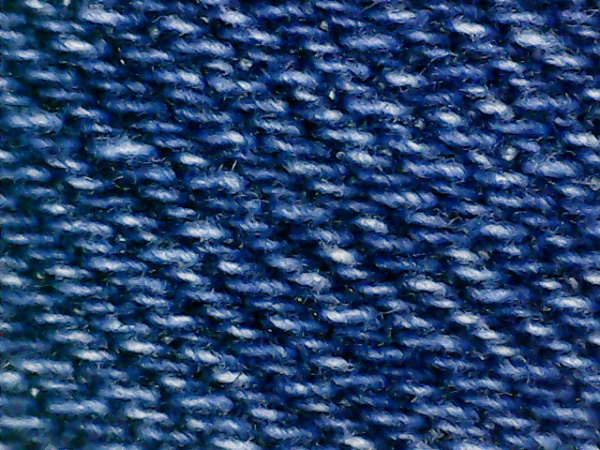

prediction: jeans      accuracy:(89.12%)
-----


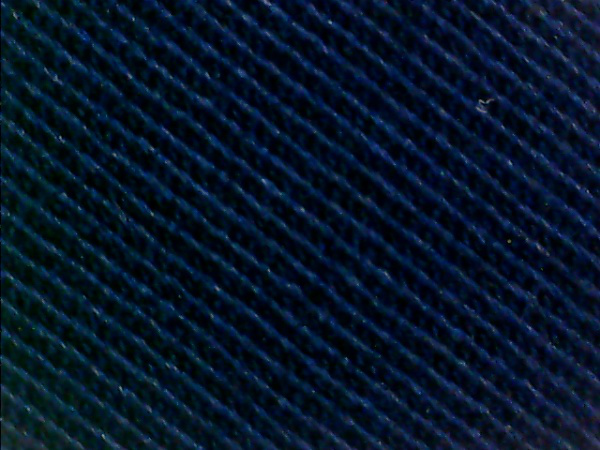

prediction: jeans      accuracy:(75.95%)
-----


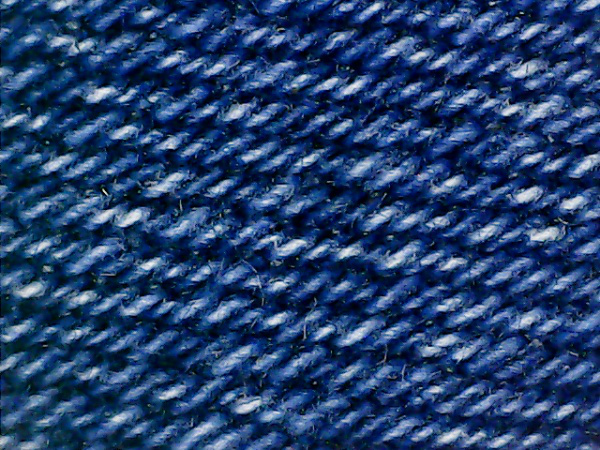

prediction: jeans      accuracy:(94.44%)
-----


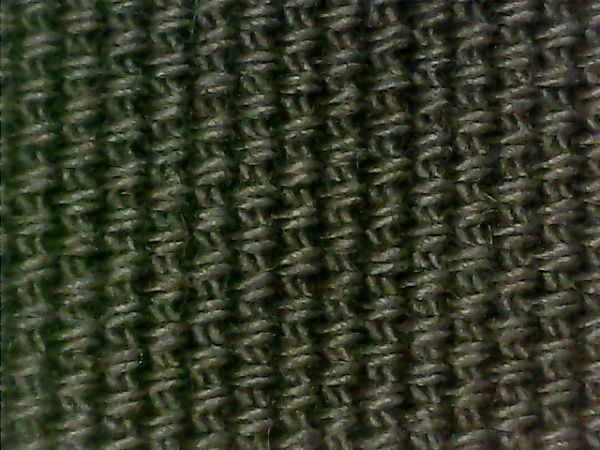

prediction: jeans      accuracy:(99.16%)
-----


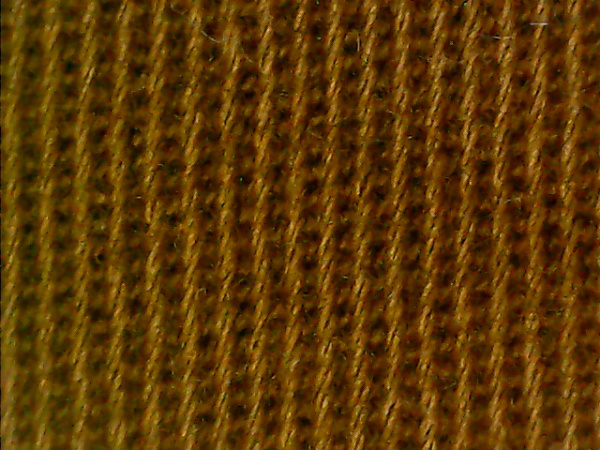

prediction: jeans      accuracy:(65.20%)
-----


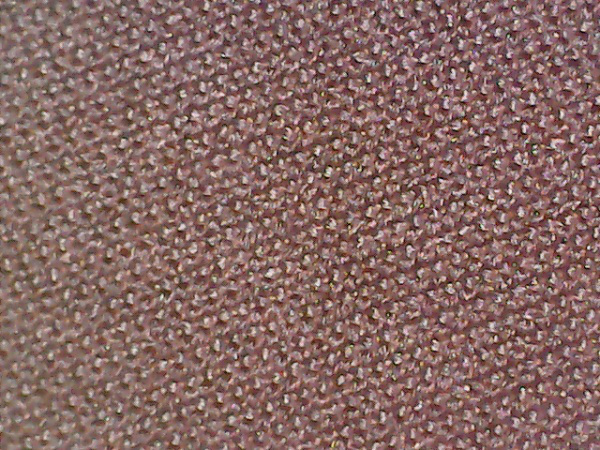

prediction: plain      accuracy:(96.45%)
-----


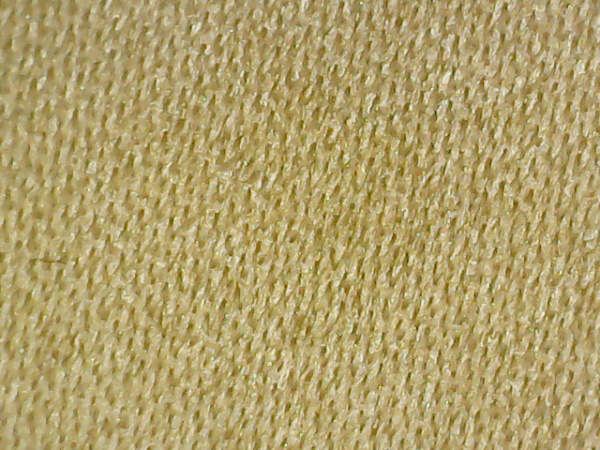

prediction: plain      accuracy:(56.94%)
-----


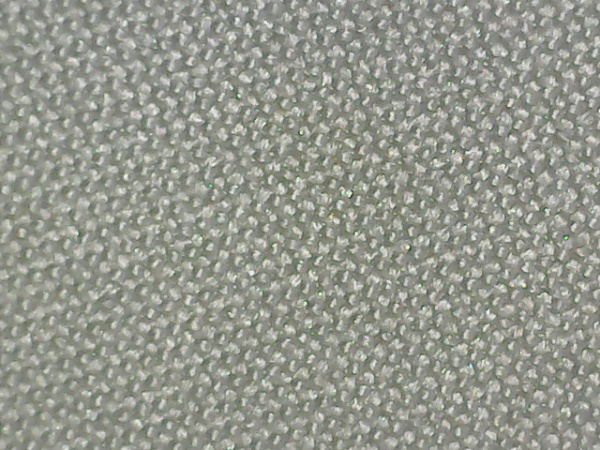

prediction: plain      accuracy:(71.75%)
-----


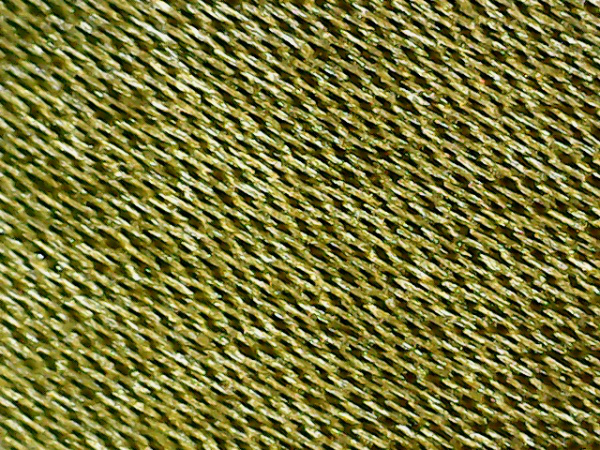

prediction: shine      accuracy:(96.05%)
-----


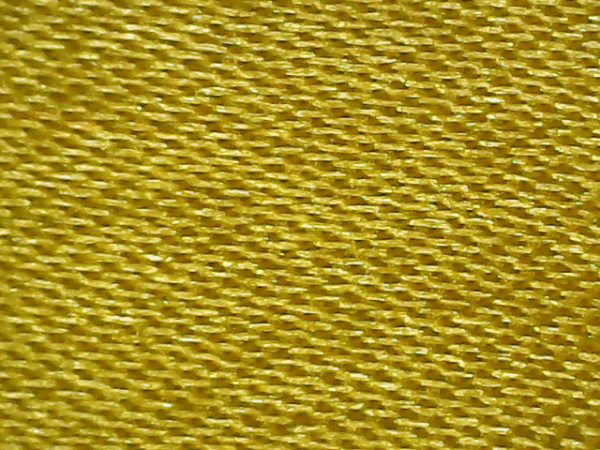

prediction: shine      accuracy:(91.56%)
Execution time: 0:00:08.408570 seconds


In [5]:
from PIL import Image
import random, datetime

# model_name = 'resnet'
# img_path = ''

all_labels = ['jeans','plain','shine']
correct_label = random.choice(all_labels)
#folder_label = os.path.join(testset,correct_label)
#file_names = next(os.walk(folder_label))[2]

#input_image = Image.open(os.path.join(folder_label, random.choice(file_names)))
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")


best_weight = ('best_weights.pth')





# Preprocess image
preprocess = transforms.Compose([
  transforms.Resize(256),
  transforms.CenterCrop(224),
  transforms.ToTensor(),
  transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])


labels_map = ['jeans', 'plain', 'shine']

model_name="densenet"
num_classes=3
feature_extract=True



if torch.cuda.is_available():
    map_location=lambda storage, loc: storage.cuda()
else:
    map_location='cpu'
    
model = initialize_model_inference(model_name, num_classes, feature_extract)
model.load_state_dict(torch.load(best_weight,  map_location='cpu'))
model.eval()




#if torch.cuda.is_available():
  #input_batch = input_batch.to("cuda")
  #model.to("cuda")

st = datetime.datetime.now()

for i in a:
    input_image = Image.open(i)
    input_tensor = preprocess(input_image)
    input_batch = input_tensor.unsqueeze(0)


    with torch.no_grad():
      logits = model(input_batch)

    # _, preds = torch.max(logits, 1)
    preds = torch.topk(logits, k=1).indices.squeeze(0).tolist()

    print("-----")
    display(input_image)
    for idx in preds:
      label = labels_map[idx]
      prob = torch.softmax(logits, dim=1)[0, idx].item()
      print(f"prediction: {label:<10} accuracy:({prob * 100:.2f}%)")
      # print(f"prediction: {label:<10} accuracy:({prob * 100:.2f}%)")
et = datetime.datetime.now()

# get execution time
elapsed_time = et - st
print('Execution time:', elapsed_time, 'seconds')